# simulation of the historical x2 and x3 leverage

In [1]:
import yfinance as yf
import pandas as pd
from sklearn.linear_model import LinearRegression
import plotly.graph_objects as go

# Query daily data of S&P 500
sp500_data = yf.download('^GSPC', start='1957-01-01')['Adj Close']
sp500_data.name = 'SP500'

# Simulate x2 and x3 leveraged returns
sp500_data_x2 = (sp500_data.pct_change() * 2 + 1).cumprod() * sp500_data.iloc[0]
sp500_data_x3 = (sp500_data.pct_change() * 3 + 1).cumprod() * sp500_data.iloc[0]

# Drop NaN values from simulated data
sp500_data_x2 = sp500_data_x2.dropna()
sp500_data_x3 = sp500_data_x3.dropna()

# Query daily data of SSO and SPXL
sso_data = yf.download('SSO', start='2006-06-19')['Adj Close']  # SSO inception
spxl_data = yf.download('SPXL', start='2008-11-05')['Adj Close']  # SPXL inception

# Fit a linear model for x2 leverage using SSO data
sso_common = pd.concat([sp500_data_x2, sso_data], axis=1, join='inner').dropna()
x2_model = LinearRegression().fit(sso_common[['SP500']], sso_common['Adj Close'])
sp500_data_x2_transformed = pd.Series(
    x2_model.predict(sp500_data_x2.to_frame(name='SP500')),
    index=sp500_data_x2.index
)

# Fit a linear model for x3 leverage using SPXL data
spxl_common = pd.concat([sp500_data_x3, spxl_data], axis=1, join='inner').dropna()
x3_model = LinearRegression().fit(spxl_common[['SP500']], spxl_common['Adj Close'])
sp500_data_x3_transformed = pd.Series(
    x3_model.predict(sp500_data_x3.to_frame(name='SP500')),
    index=sp500_data_x3.index
)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


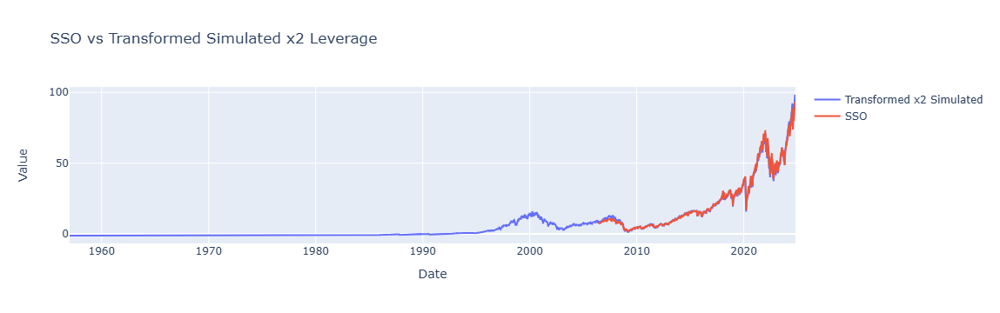

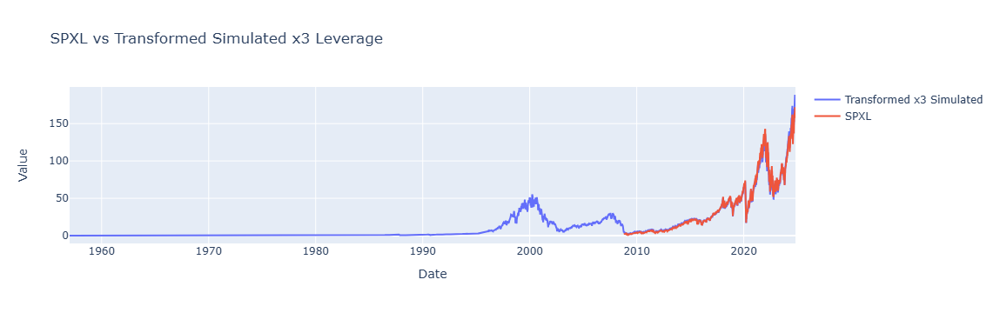

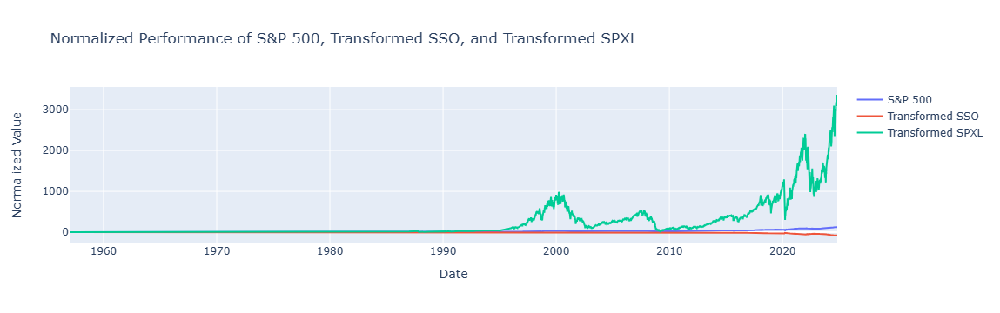

In [2]:
# Plot SSO and transformed simulated x2 leverage values
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=sp500_data_x2_transformed.index, y=sp500_data_x2_transformed, mode='lines', name='Transformed x2 Simulated'))
fig1.add_trace(go.Scatter(x=sso_data.index, y=sso_data, mode='lines', name='SSO'))
fig1.update_layout(title='SSO vs Transformed Simulated x2 Leverage', xaxis_title='Date', yaxis_title='Value')
fig1.show()

# Plot SPXL and transformed simulated x3 leverage values
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=sp500_data_x3_transformed.index, y=sp500_data_x3_transformed, mode='lines', name='Transformed x3 Simulated'))
fig2.add_trace(go.Scatter(x=spxl_data.index, y=spxl_data, mode='lines', name='SPXL'))
fig2.update_layout(title='SPXL vs Transformed Simulated x3 Leverage', xaxis_title='Date', yaxis_title='Value')
fig2.show()

# Calculate and plot ratios over the first day for SP500, transformed SSO, and transformed SPXL
normalized_sp500 = sp500_data / sp500_data.iloc[0]
normalized_sso = sp500_data_x2_transformed / sp500_data_x2_transformed.iloc[0]
normalized_spxl = sp500_data_x3_transformed / sp500_data_x3_transformed.iloc[0]

fig3 = go.Figure()
fig3.add_trace(go.Scatter(x=normalized_sp500.index, y=normalized_sp500, mode='lines', name='S&P 500'))
fig3.add_trace(go.Scatter(x=normalized_sso.index, y=normalized_sso, mode='lines', name='Transformed SSO'))
fig3.add_trace(go.Scatter(x=normalized_spxl.index, y=normalized_spxl, mode='lines', name='Transformed SPXL'))
fig3.update_layout(title='Normalized Performance of S&P 500, Transformed SSO, and Transformed SPXL',
                   xaxis_title='Date', yaxis_title='Normalized Value')
fig3.show()

# return of holding x years

In [3]:
import pandas as pd

# Assuming sp500_data, sp500_data_x2_transformed, and sp500_data_x3_transformed are pandas Series
df = pd.concat(
    [
        sp500_data.rename("sp500"),
        sp500_data_x2_transformed.rename("sp500x2"),
        sp500_data_x3_transformed.rename("sp500x3")
    ],
    axis=1
)

# Display the resulting DataFrame
df

,sp500,sp500x2,sp500x3
Date,,,
1957-01-02,46.200001,NaN,NaN
1957-01-03,46.599998,-1.186356,0.056084
1957-01-04,46.660000,-1.186259,0.056169
1957-01-07,46.419998,-1.186647,0.055828
1957-01-08,46.250000,-1.186920,0.055590
...,...,...,...
2024-10-25,5808.120117,96.370932,183.137332
2024-10-28,5823.520020,96.888467,184.593796
2024-10-29,5832.919922,97.205199,185.487505


In [4]:
import pandas as pd

# Assuming df is your DataFrame with Date as the index and the specified columns
# Ensure that the DataFrame's index is of datetime type
df.index = pd.to_datetime(df.index)

# Function to calculate median return over a specified number of years
def calculate_median_returns(df, years):
    trading_days_per_year = 252  # Number of trading days in a year
    window_size = years * trading_days_per_year
    returns = {column: [] for column in df.columns}  # Initialize dictionary to store returns

    # Loop over each column to calculate returns
    for column in df.columns:
        # Calculate the returns for each sliding window
        for start in range(len(df) - window_size + 1):
            end = start + window_size
            initial_price = df[column].iloc[start]
            final_price = df[column].iloc[end - 1]
            # Calculate the return as (final_price - initial_price) / initial_price
            return_value = (final_price - initial_price) / initial_price
            returns[column].append(return_value)

    # Calculate the median return for each column
    median_returns = {column: pd.Series(values).median() for column, values in returns.items()}
    
    return median_returns

# Calculate median returns for the specified periods
return_periods = [1, 2, 5, 10, 20, 30]
results = {f"{years}_years": calculate_median_returns(df, years) for years in return_periods}

# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Display the results DataFrame
results_df

,1_years,2_years,5_years,10_years,20_years,30_years
sp500,0.099670,0.168431,0.484008,1.039485,2.682469,8.817550
sp500x2,0.008238,-0.000988,-0.033852,-0.053769,-0.480873,-6.519502
sp500x3,0.213661,0.338044,0.891249,2.107224,5.953749,43.114139
